
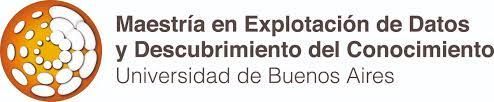

--------
#      **_Data mining en Ciencia y Tecnología_**
                2do cuatrimestre 2021 
              Pre TRABAJO PRÁCTICO Nº 1
    Preparación de registros electroencefalográficos

**GRUPO 7**

<u>**Integrantes**</u>:

* López Malizia, Álvaro
* Padula, Eliana Inés
* Rodrigues Pires, Magali
* Rossi, Fabiana Alejandra
--------

Link OLEAF TP: https://www.overleaf.com/project/61751f2db3b133777abdffc6

------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------
# **PRE-TP1**

------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------

### IMPORTO LIBRERÍAS Y DATOS

In [34]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [35]:
import sys
sys.path.append('/content/drive/MyDrive/CyT_2021/procesados')
#sys.path.append('/content/drive/MyDrive/procesados')

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt 
import matplotlib.gridspec as gridspec
from scipy.signal import butter, lfilter
from sklearn import decomposition
from sklearn.datasets import  fetch_openml, load_digits
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.manifold import MDS, Isomap, SpectralEmbedding, TSNE
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from scipy.stats import chi2
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity, cosine_distances
from scipy.spatial.distance import squareform
!pip install gower
import gower
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
from sklearn.metrics import adjusted_rand_score
!pip install scikit-learn-extra 
from sklearn_extra.cluster import KMedoids 
from sklearn.metrics import silhouette_samples, silhouette_score
!pip install mne
import mne
import os

### FUNCIONES

In [37]:
def print_EEG(EEG,ch,ch_names ):
  inicio = 1
  fin    = 10
  xticks = np.arange(inicio*srate,(fin+1)*srate,srate)
  fig,ax = plt.subplots(ncols=1,figsize=(16,8))
#fig.suptitle('Series temporales (uV)') 
  yticks=[]
  for c in np.arange(ch):
    temp = EEGdata[c,inicio*srate:fin*srate]
    dmin=np.min(temp)
    dmax=np.max(temp)
    vmedio = np.mean([dmin,dmax])+30*c
    yticks.append(vmedio)
    ax.plot(np.arange(inicio*srate,fin*srate),vmedio*np.ones_like(temp)+temp,'k')
  ax.set_xlim([inicio*srate,fin*srate])
  ax.set_xticks(xticks)
  ax.set_xticklabels(np.arange(inicio,fin+1))
  ax.set_yticks(yticks)
  ax.set_yticklabels(mont1020_30.ch_names)
  ax.set_ylabel('channels')
  ax.set_xlabel('Time (s)')
  
  plt.show()


In [38]:
def topologia (EEGdata, info_eeg):
  inicio = 1
  fin    = 4 ##########
  fig, ax = plt.subplots( figsize=(8, 4), gridspec_kw=dict(top=0.9),sharex=True, sharey=True)
  im,cm   = mne.viz.plot_topomap(EEGdata[:,inicio*srate:fin*srate].mean(axis=1),info_eeg,vmin=-0.05,vmax=0.3,cmap='coolwarm', contours=0, show=True)
  ax.set_title('topogragía promedio')
  ax_x_start = 0.95
  ax_x_width = 0.04
  ax_y_start = 0.1
  ax_y_height = 0.9
  cbar_ax = fig.add_axes([ax_x_start, ax_y_start, ax_x_width, ax_y_height])
  clb = fig.colorbar(im, cax=cbar_ax)
  

In [39]:
def pca_a(EEGdata, info_eeg):
  pca = decomposition.PCA(n_components=3)
  pca.fit(EEGdata)
  pcs = pca.transform(EEGdata)
  print(pcs.shape)
  var = pca.explained_variance_ratio_
  fig2, ax = plt.subplots(ncols=pcs.shape[1], figsize=(10, 3), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)
  for p in range(pcs.shape[1]):
    mne.viz.plot_topomap(pcs[:,p],
                    info_eeg,
                    cmap='coolwarm', contours=0,
                    axes=ax[p],show=False)
    ax[p].set_title('var:'+str(round(var[p]*100,2)) ) 

### 1. GRAFICOS series temporales para cada canal

suj_9_bl_1
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


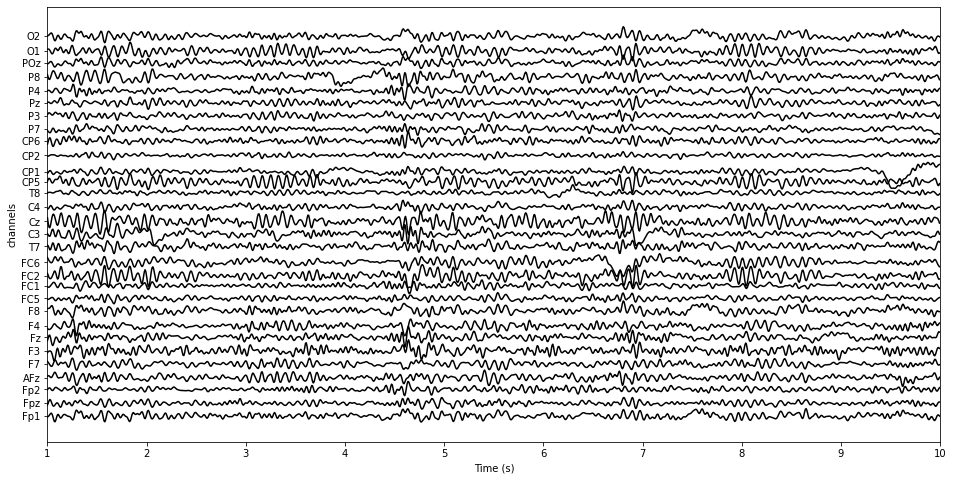

suj_9_bl_2
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


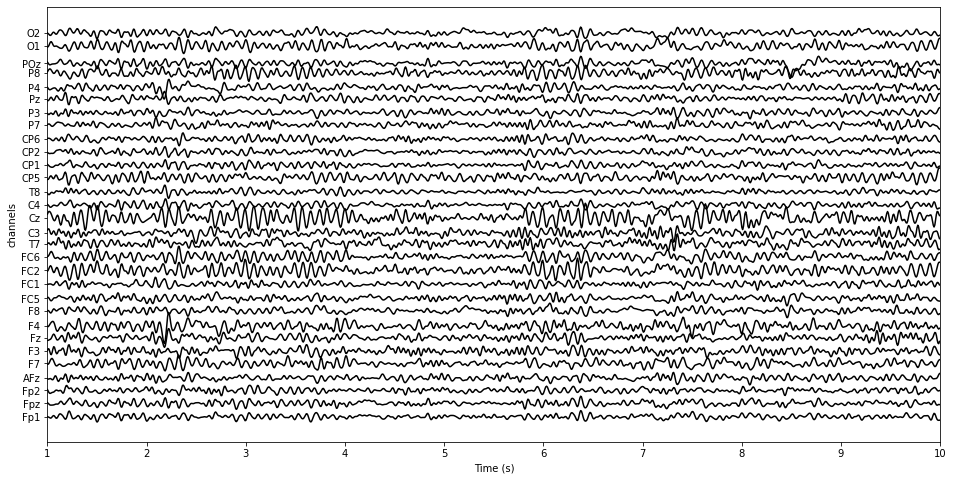

suj_10_bl_1
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


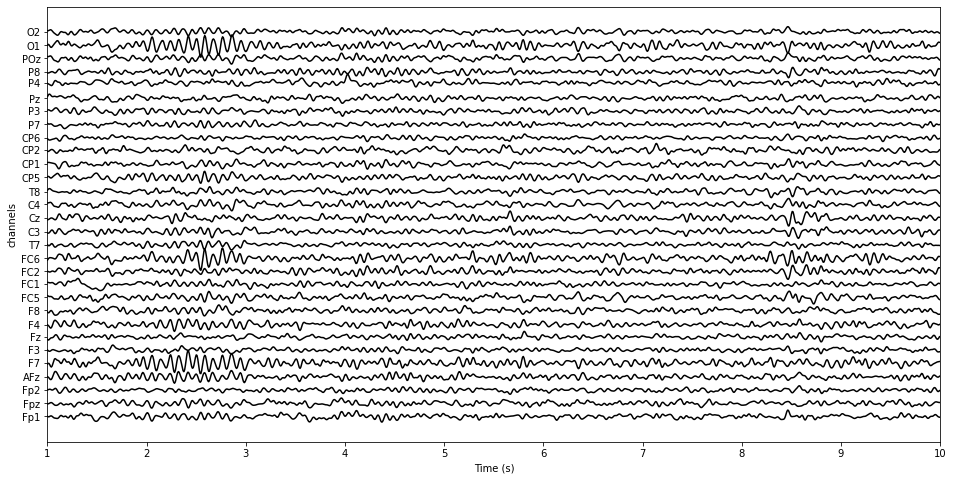

suj_10_bl_2
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


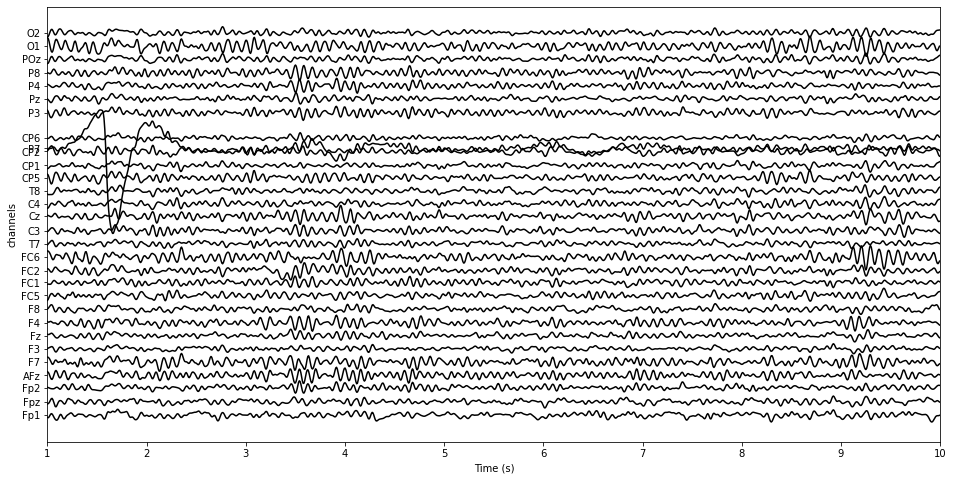

suj_8_bl_1
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


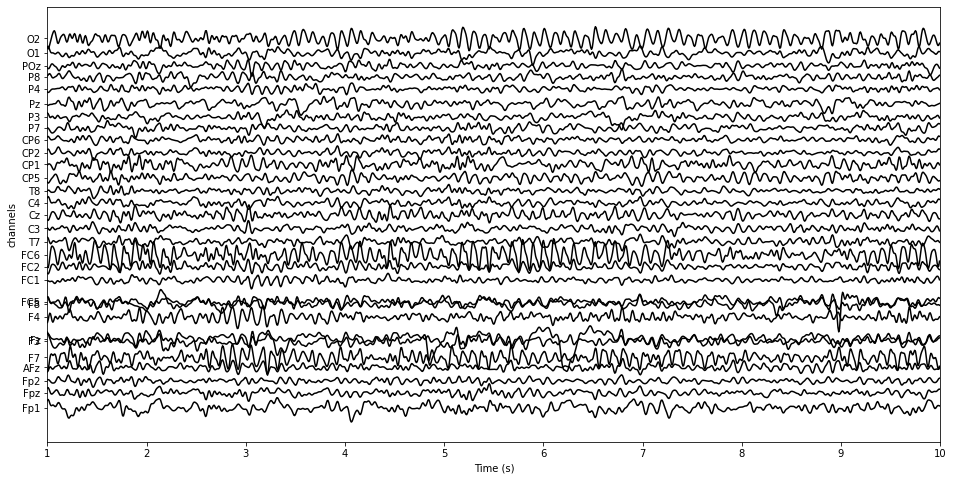

suj_8_bl_2
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


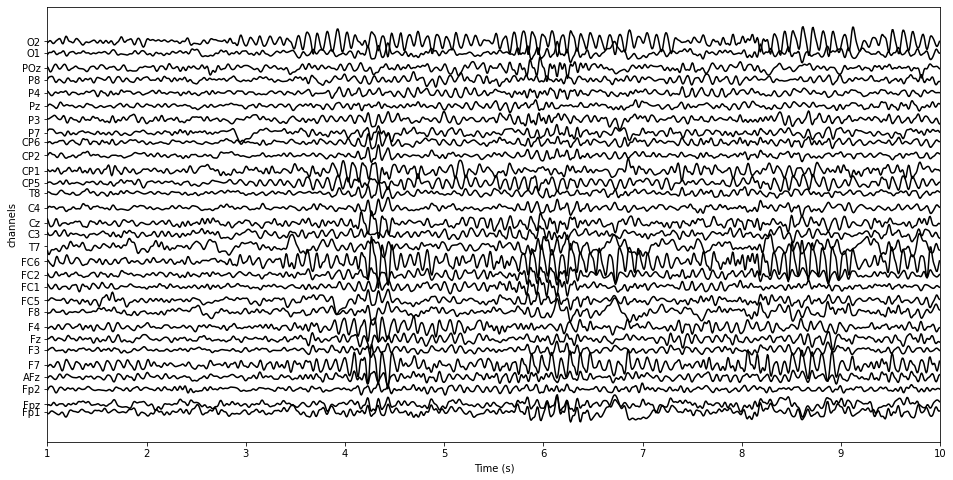

suj_12_bl_1
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


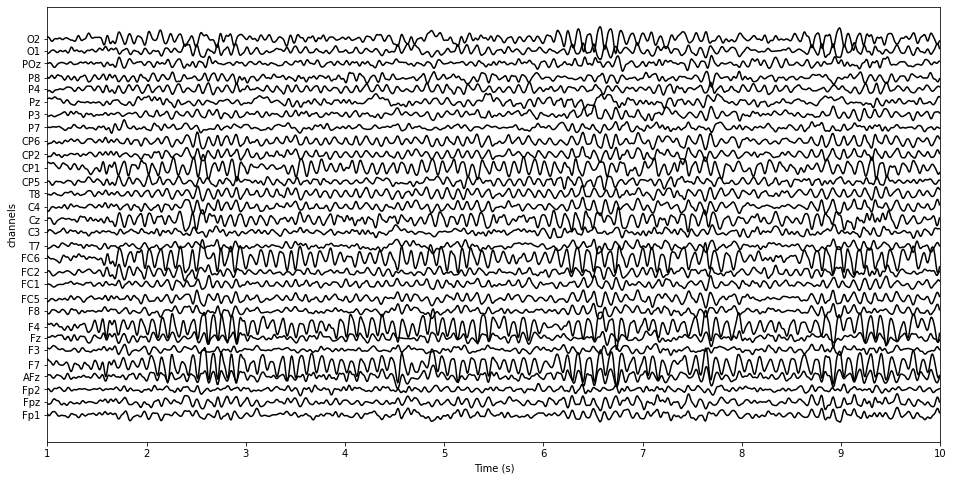

suj_12_bl_2
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


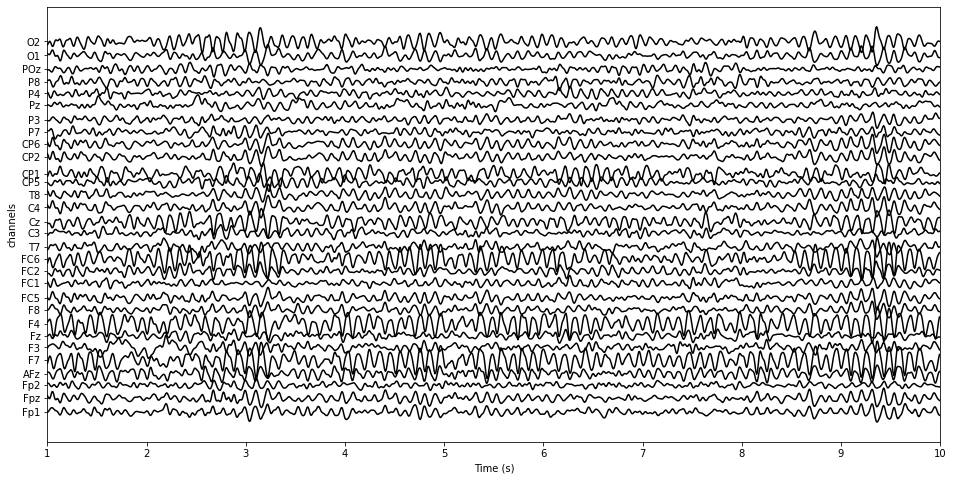

suj_13_bl_1
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


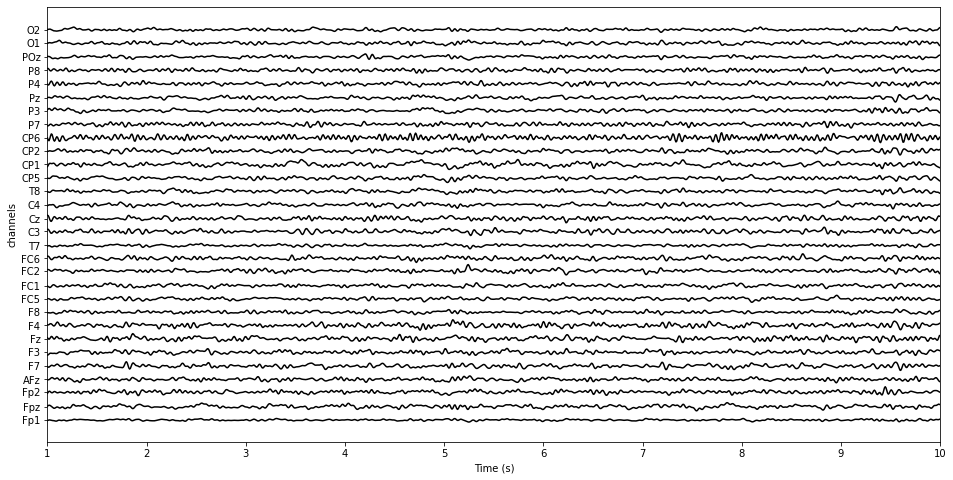

suj_13_bl_2
Sampling rate: 128.00 Hz
Data shape: 7681 samples x 30 channels
Tiempo total : 60.01 


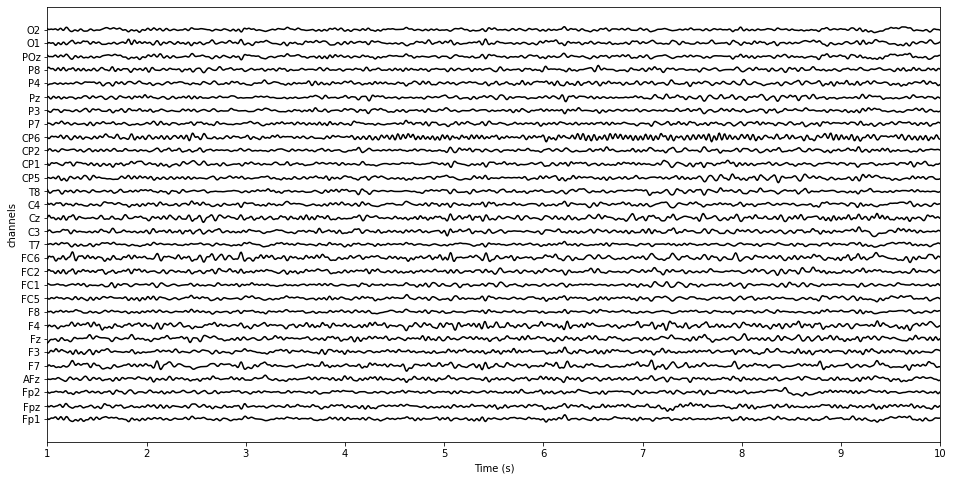

In [40]:
folder='/content/drive/MyDrive/CyT_2021/procesados/'
for filename in os.listdir(folder):
  f=str(os.path.join(filename))[:-4] 
  print(f)
  f= pd.read_csv(os.path.join(folder,filename), sep=',', header=None)
  EEGdata=f.to_numpy()
  srate=128
  ch=EEGdata.shape[0]
  samples=EEGdata.shape[1]
  print("Sampling rate: {:.2f} Hz".format(srate))
  print("Data shape: {:d} samples x {:d} channels".format(EEGdata.shape[1], EEGdata.shape[0]))
  print("Tiempo total : {:.2f} ".format(samples/srate))
  # Montage 10-20
  mont1020 = mne.channels.make_standard_montage('standard_1020')
# Elijo canales que tengo
  kept_channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 
                 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'FC1', 'FC2',
                 'FC5', 'FC6','CP1','CP2','CP5','CP6','AFz','Fpz','POz']

  ind = [i for (i, channel) in enumerate(mont1020.ch_names) if channel in kept_channels]
  mont1020_30 = mont1020.copy()
# Me quedo solo con los canales seleccionados
  mont1020_30.ch_names = [mont1020.ch_names[x] for x in ind]
  kept_channel_info = [mont1020.dig[x+3] for x in ind]
# Me quedo con las referencias desde dónde están ubicados los canales
  mont1020_30.dig = mont1020.dig[0:3]+kept_channel_info
  info_eeg = mne.create_info(ch_names=mont1020_30.ch_names, sfreq=128,
                            ch_types='eeg').set_montage(mont1020_30)
  
  print_EEG(EEGdata, ch, mont1020_30.ch_names)

### 2. Graficar los promedios de la topografía para cada participante. ¿Hay diferencias entre los dos períodos de reposo?

suj_9_bl_1


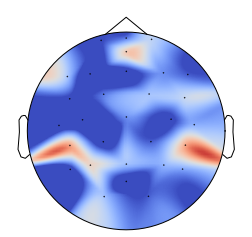

suj_9_bl_2


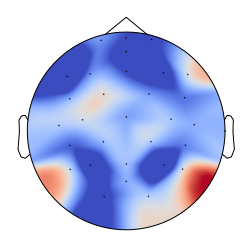

suj_10_bl_1


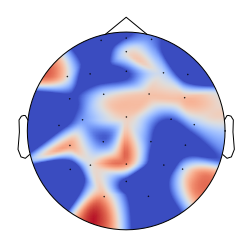

suj_10_bl_2


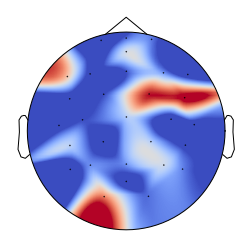

suj_8_bl_1


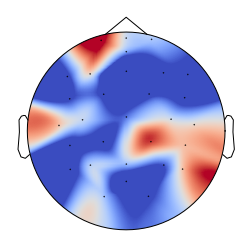

suj_8_bl_2


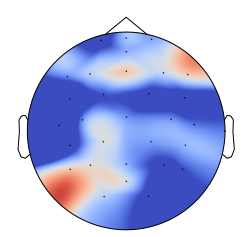

suj_12_bl_1


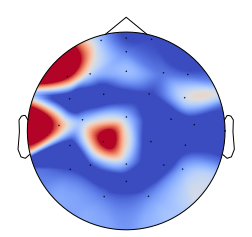

suj_12_bl_2


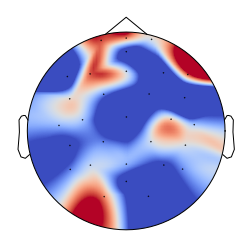

suj_13_bl_1


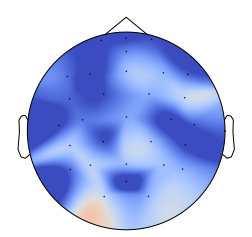

suj_13_bl_2


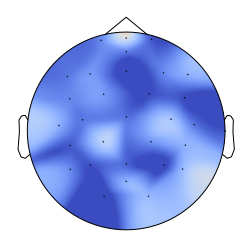

In [41]:
for filename in os.listdir(folder):
  f=str(os.path.join(filename))[:-4] 
  print(f)
  f= pd.read_csv(os.path.join(folder,filename), sep=',', header=None)
  EEGdata=f.to_numpy()
  srate=128
  ch=EEGdata.shape[0]
  samples=EEGdata.shape[1]
  
  # Montage 10-20
  mont1020 = mne.channels.make_standard_montage('standard_1020')
# Elijo canales que tengo
  kept_channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 
                 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'FC1', 'FC2',
                 'FC5', 'FC6','CP1','CP2','CP5','CP6','AFz','Fpz','POz']

  ind = [i for (i, channel) in enumerate(mont1020.ch_names) if channel in kept_channels]
  mont1020_30 = mont1020.copy()
# Me quedo solo con los canales seleccionados
  mont1020_30.ch_names = [mont1020.ch_names[x] for x in ind]
  kept_channel_info = [mont1020.dig[x+3] for x in ind]
# Me quedo con las referencias desde dónde están ubicados los canales
  mont1020_30.dig = mont1020.dig[0:3]+kept_channel_info
  info_eeg = mne.create_info(ch_names=mont1020_30.ch_names, sfreq=128,
                            ch_types='eeg').set_montage(mont1020_30)

  topologia(EEGdata, info_eeg)


In [42]:
for i in range(0, len(os.listdir(folder)), 2):
  f=str(os.listdir(folder)[i])[:-9]
  pre= (pd.read_csv(os.path.join(folder,os.listdir(folder)[i]), sep=',', header=None)).to_numpy()
  post= (pd.read_csv(os.path.join(folder,os.listdir(folder)[i+1]), sep=',', header=None)).to_numpy()
  dist = np.linalg.norm(pre-post)
  print(f,'-> ', end='')
  print(round(dist,2))

suj_9 -> 3494.62
suj_10 -> 3299.28
suj_8 -> 4794.85
suj_12 -> 5697.68
suj_13 -> 1718.25


### 3. Calcular las componentes principales para el total de los datos (concatenados en el tiempo). ¿Qué peso tiene cada proyección en los distintos períodos de reposo?

PCA concatenando pre+pre+pre+pre ... de cada sujeto, y post+post de cada sujeto, por separado


In [43]:
# Se concatenan los 5 sujetos en el periodo pre-aprendizaje por un lado, y los datos de los 5 sujetos en periodo de post-aprendizaje por el otro
lista_pre=[]
lista_post=[]

for i in range(0, len(os.listdir(folder)), 2):
  df_pre= pd.read_csv(os.path.join(folder,os.listdir(folder)[i]), sep=',', header=None)
  df_post= pd.read_csv(os.path.join(folder,os.listdir(folder)[i+1]), sep=',', header=None)
  lista_pre.append(df_pre)
  lista_post.append(df_post)

In [44]:
final_pre=pd.concat(lista_pre, axis=1)
final_post=pd.concat(lista_post,axis=1)

PRE
(30, 3)


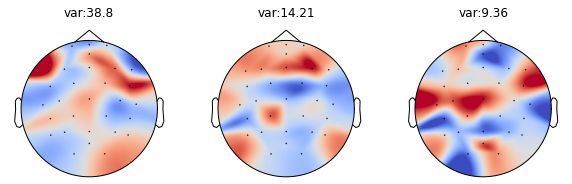

In [45]:
EEGdata_pre=final_pre.to_numpy()
EEGdata_post=final_post.to_numpy()
# ------------------------------------------
print('PRE')
pca_a(EEGdata_pre, info_eeg)

POST
(30, 3)


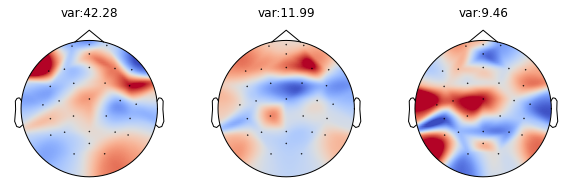

In [46]:
print('POST')
pca_a(EEGdata_post, info_eeg)

### 4. Referenciar los datos al promedio por sample. (es decir, para cada tiempo, estandarizar cada canal con el promedio de todos los canales)

suj_9_bl_1


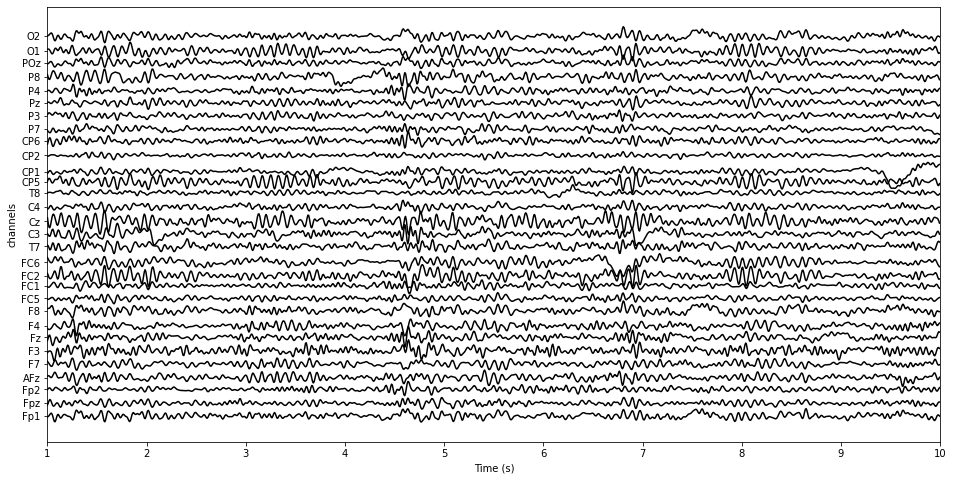

suj_9_bl_2


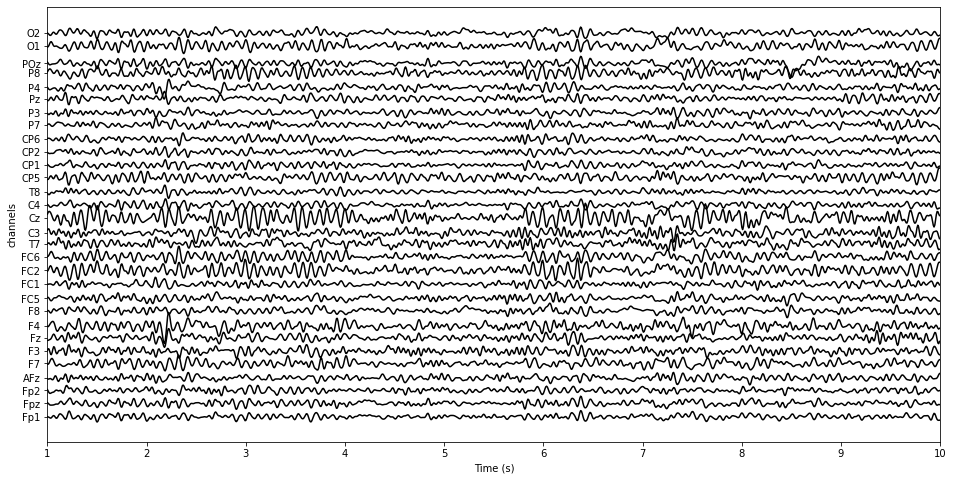

suj_10_bl_1


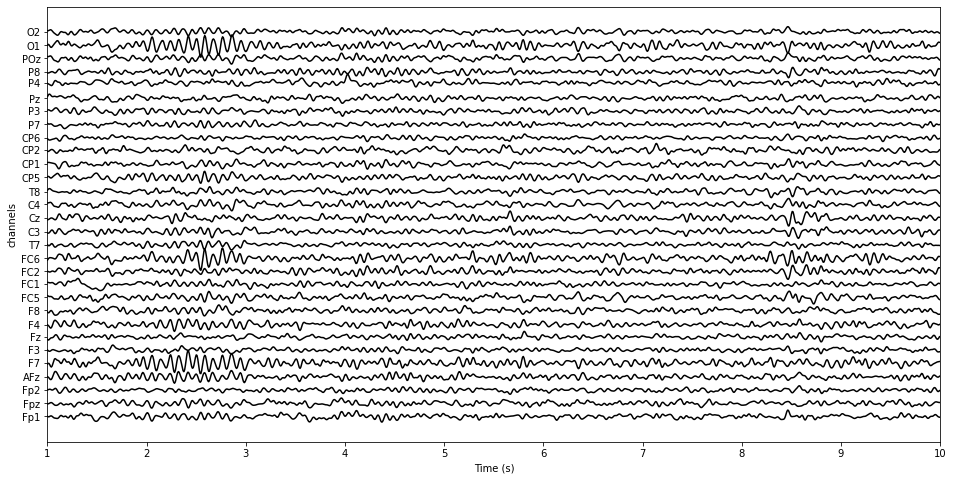

suj_10_bl_2


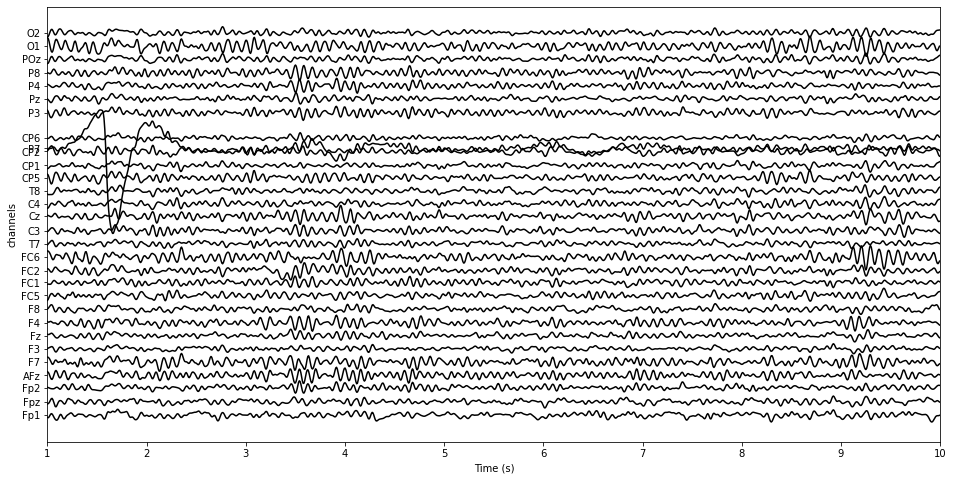

suj_8_bl_1


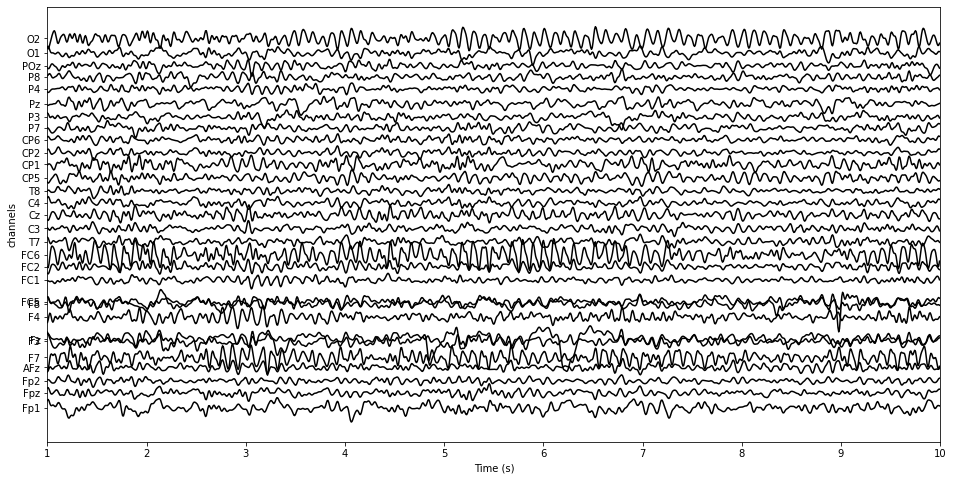

suj_8_bl_2


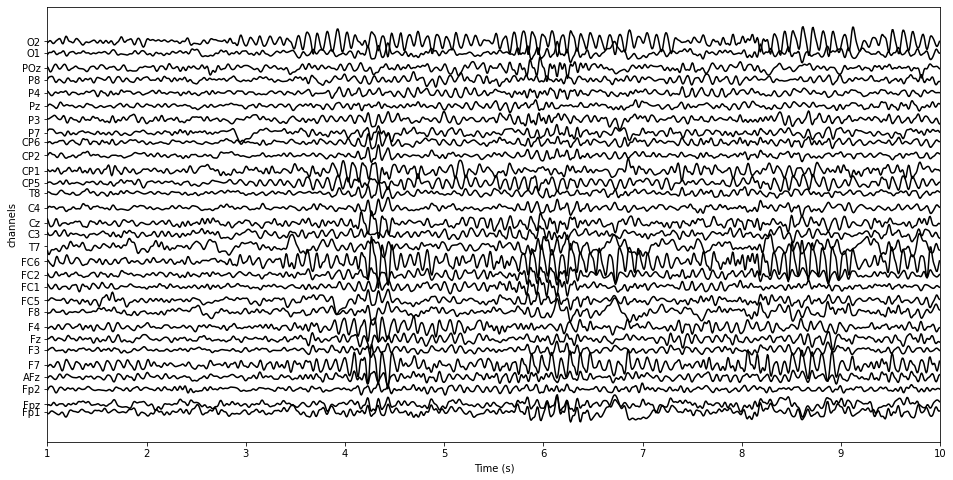

suj_12_bl_1


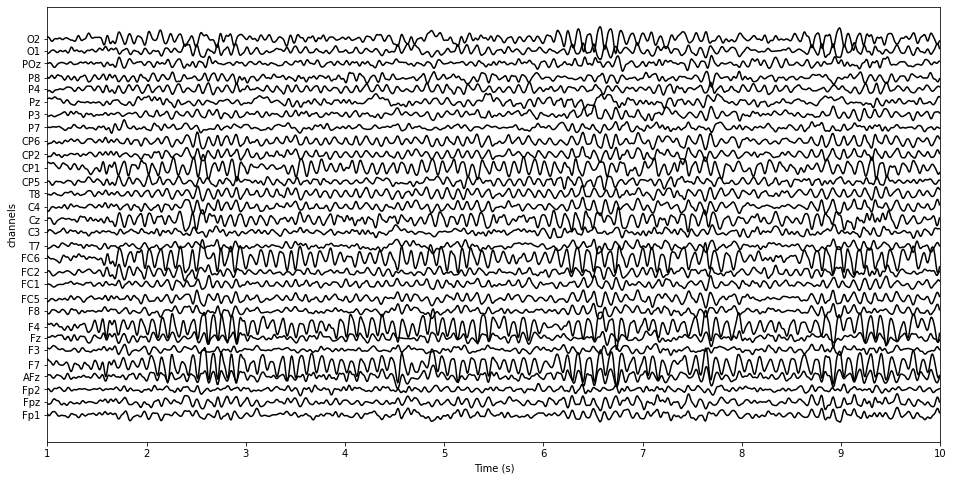

suj_12_bl_2


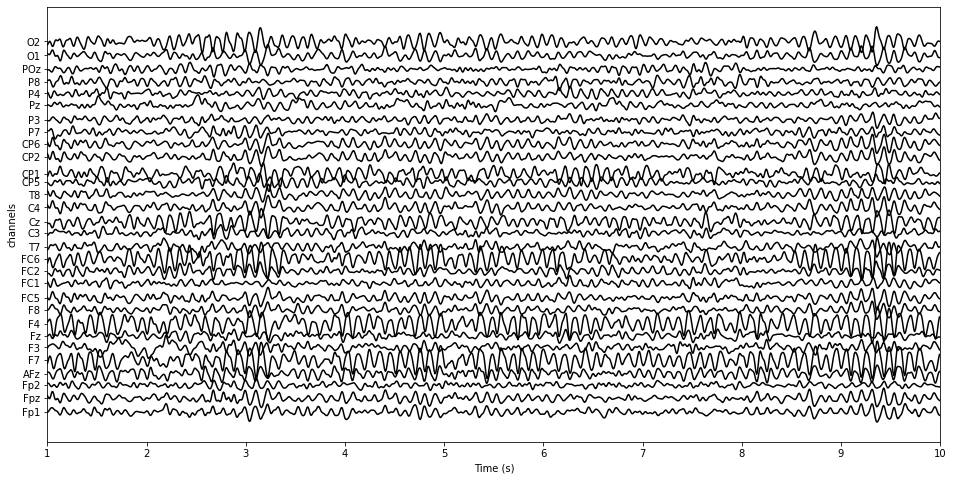

suj_13_bl_1


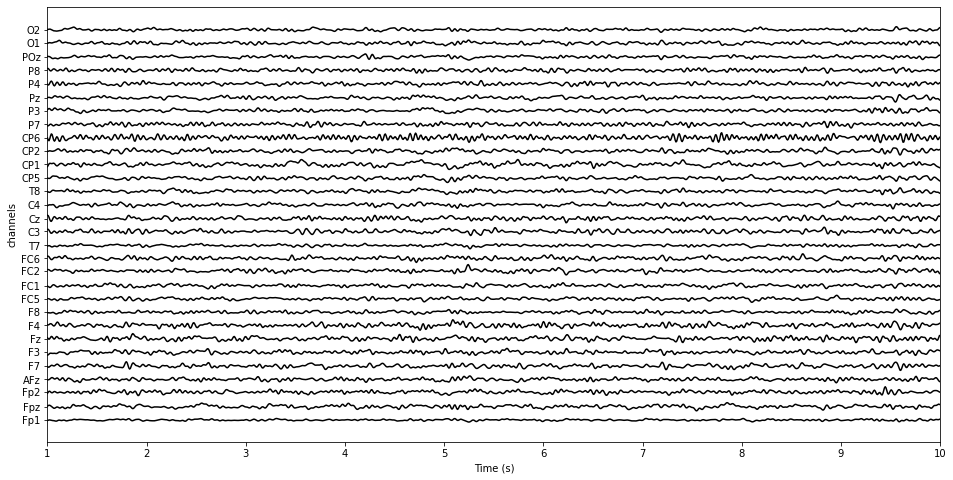

suj_13_bl_2


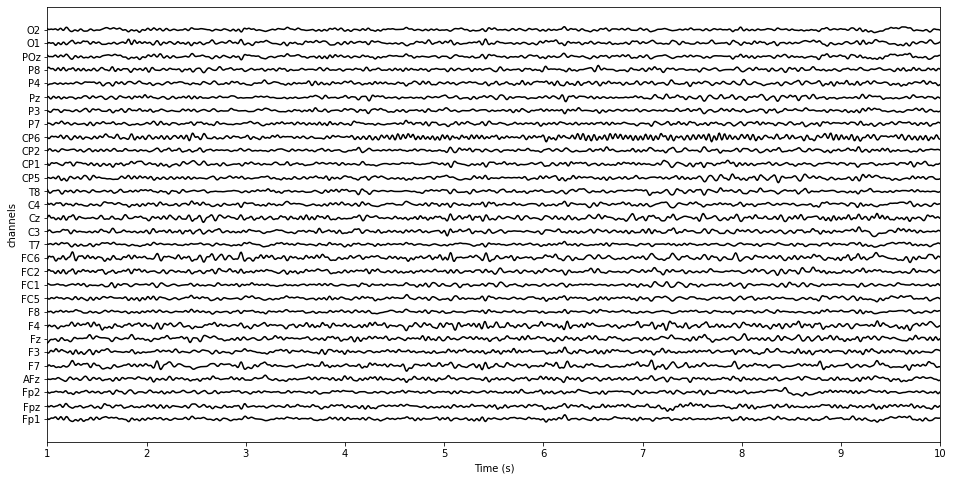

In [47]:
for filename in os.listdir(folder):
  f=str(os.path.join(filename))[:-4] 
  print(f)
  f= pd.read_csv(os.path.join(folder,filename), sep=',', header=None)
  EEGdata=f.to_numpy()
  srate=128
  ch=EEGdata.shape[0]
  samples=EEGdata.shape[1]
  mean= EEGdata.mean(axis=1,keepdims=True)
  EEGdata2= EEGdata-mean


  print_EEG(EEGdata2, ch, mont1020_30.ch_names)

### 5. Calcular el Campo de Potencia Global (acá lo hicimos para cada sujeto)


GRAFICOS DE GFP PARA CADA SUJETO, EN CADA CONDICIÓN DE REPOSO

suj_9_bl_1


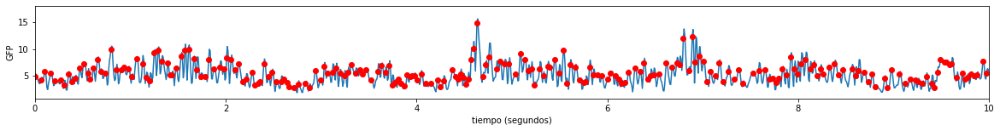

suj_9_bl_1 1366
suj_9_bl_2


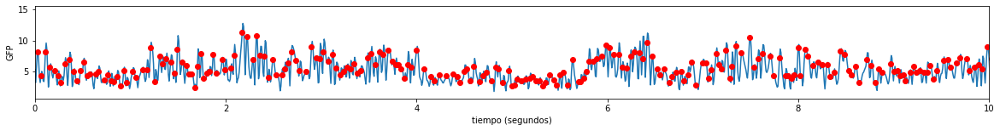

suj_9_bl_2 1420
suj_10_bl_1


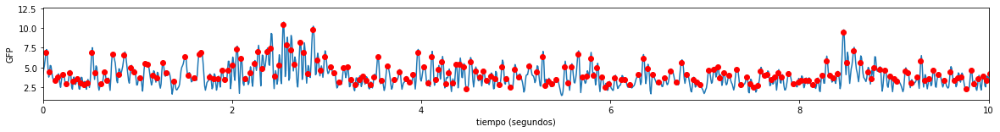

suj_10_bl_1 1289
suj_10_bl_2


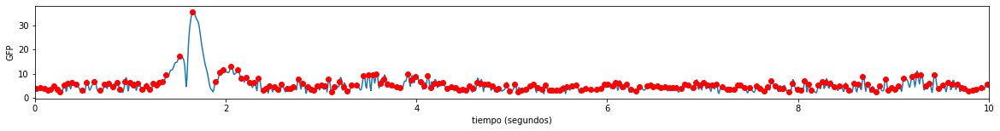

suj_10_bl_2 1300
suj_8_bl_1


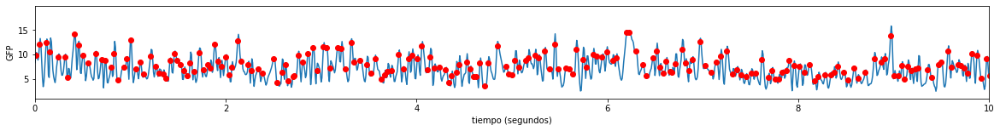

suj_8_bl_1 1293
suj_8_bl_2


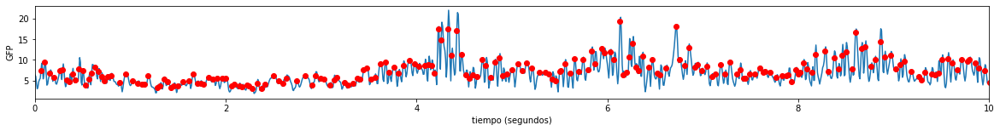

suj_8_bl_2 1337
suj_12_bl_1


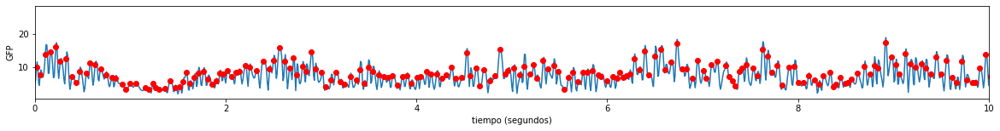

suj_12_bl_1 1176
suj_12_bl_2


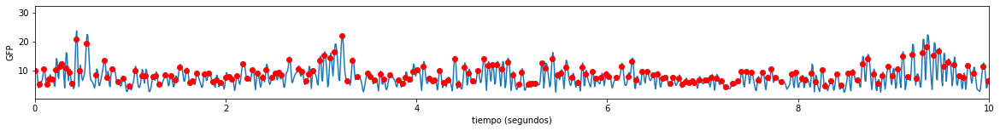

suj_12_bl_2 1188
suj_13_bl_1


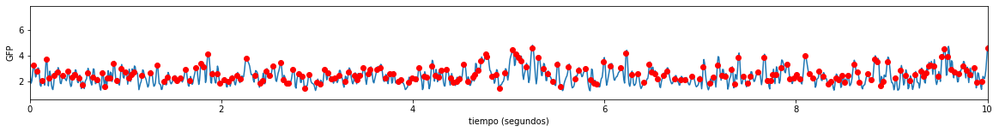

suj_13_bl_1 1353
suj_13_bl_2


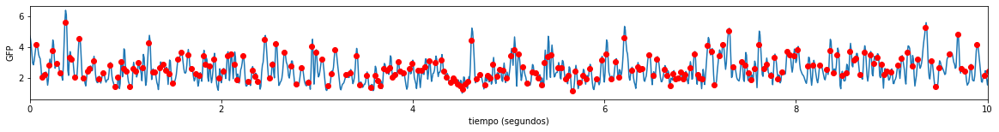

suj_13_bl_2 1408


In [48]:
indx_picos_total=[] # indices de los picos
tiempos_picos_total=[] # tiempos de los picos
GFP_picos_total=[] # valor de GFP de los picos

for filename in os.listdir(folder):
  f=str(os.path.join(filename))[:-4] 
  g=str(os.path.join(filename))[:-4] 
  print(f) # acá le estoy pidiendo que me diga el nombre del sujeto

  f= pd.read_csv(os.path.join(folder,filename), sep=',', header=None) # cada dato, lo leo como dataframe
  EEGdata=f.to_numpy() # luego lo paso a numpy
  srate=128 # tasa de muestreo
  mean= EEGdata.mean(axis=1,keepdims=True) # calculo media de cada file -> me genera un vector de medias para cada tiempo
  EEGdata2= EEGdata-mean # A cada matrix, le resto el vector de medias

  # calculo GFP según fórmula del TP 
  GFP=np.sqrt(sum(EEGdata2**2)/len(EEGdata2))

  # genero un eje x para graficar. 
  
  #Le pido un array que vaya desde 0" hasta el total de mis datos/128 Hz (es decir, el total de mis time 
  #data points dividido la frecuencia de sampleo)
  t = np.arange(0,7681/128,1/srate) # esto queda en segundos 
  #indice desde 0 para mis valores de GFP
  s=np.arange(0,7681)
  
  
  # cálculo de tiempo, índice y valor de GFP peaks
  tiempos = [tt for tt,x0,x1,x2 in zip(t,GFP[0:-2],GFP[1:-1],GFP[2:]) if (x0<x1 and x1>x2)]
  indx = [ss for ss,x0,x1,x2 in zip(s,GFP[0:-2],GFP[1:-1],GFP[2:]) if (x0<x1 and x1>x2)] 
  GFP_picos= GFP[indx]
  
  #grafico
  plt.figure(figsize=(20, 2)) 
  plt.plot(t,GFP)
  plt.plot(t[indx],GFP[indx],'ro')
  plt.xlabel('tiempo (segundos)')
  plt.ylabel('GFP')
  plt.xlim(min(t),10)
  plt.show()
  


  # Junto todo en las listas específicas
  tiempos_picos_total.append(tiempos) # tiempos de los picos
  indx_picos_total.append(indx) # índice de picos
  GFP_picos_total.append(GFP_picos) # valor de pico en GFP
  

  print(g, len(indx)) 

...

------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------
# **TP1**

------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------------------

# TAREA 1

Calcular el Campo de Potencia Global (GFP), a partir de la concatenación en el tiempo de los registros en un dataset único. 

Encontrar los picos máximos del GFP, guardar los mapas para cada máximo
( ~xn). Estudiar la presencia de mapas outliers. Para ello puede usar PCA y/o clustering jerarquico y/o matriz de distancias.



In [49]:
lista_files=[]

for i in range(0, len(os.listdir(folder))):
  df= pd.read_csv(os.path.join(folder,os.listdir(folder)[i]), sep=',', header=None)
  lista_files.append(df)

df_final=pd.concat(lista_files, axis=1)
EEGdata_final=df_final.to_numpy()

In [50]:
srate=128 # tasa de muestreo
mean= EEGdata_final.mean(axis=1,keepdims=True) # calculo media de cada file -> me genera un vector de medias para cada tiempo
EEGdata_final_norm= EEGdata_final-mean # A cada matrix, le resto el vector de medias

# calculo GFP según fórmula del TP 
GFP=np.sqrt(sum(EEGdata_final_norm**2)/len(EEGdata_final_norm))

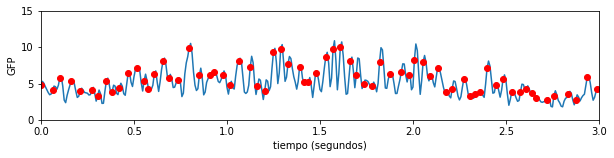

Se están graficando nada más que los primeros 10 segundos de los registros concatenados


In [69]:
# genero un eje x para graficar. 
  
#Le pido un array que vaya desde 0" hasta el total de mis datos/128 Hz (es decir, el total de mis time 
#data points [len(GFP)] dividido la frecuencia de sampleo)
t = np.arange(0,len(GFP)/128,1/srate) # esto queda en segundos 
#indice desde 0 para mis valores de GFP
s=np.arange(0,len(GFP))
  
# cálculo de tiempo, índice y valor de GFP peaks
tiempos = [tt for tt,x0,x1,x2 in zip(t,GFP[0:-2],GFP[1:-1],GFP[2:]) if (x0<x1 and x1>x2)]
indx = [ss for ss,x0,x1,x2 in zip(s,GFP[0:-2],GFP[1:-1],GFP[2:]) if (x0<x1 and x1>x2)] 
GFP_picos= GFP[indx]
  
  #grafico
plt.figure(figsize=(10, 2)) 
plt.plot(t,GFP)
plt.plot(t[indx],GFP[indx],'ro')
plt.xlabel('tiempo (segundos)')
plt.ylabel('GFP')
plt.xlim(min(t),3)
plt.ylim(0,15)
plt.show()
  

print('Se están graficando nada más que los primeros 10 segundos de los registros concatenados')

In [52]:
# guardar mapas para cada máximo 
# armo una lista llamada mapas, donde pongo los vectores de dim 30 (canales) para cada uno de los EEG data en los picos de GFP
mapas=[]

EEGdata_final.shape # 30 canales, y 76810 datos (los 10 registros concatenados)

for i in indx:
  mapas.append(EEGdata_final[:,i])

### PCA

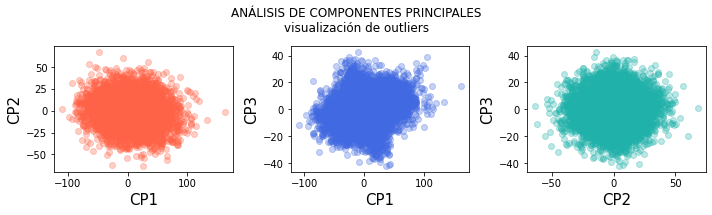

In [53]:
# evaluar outliers
# PCA - sólo se grafican las primeras 3 componentes, y sus combinaciones

pca = PCA(n_components=6) 
Y = pca.fit_transform(mapas)


fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 3))

ax[0].scatter(Y[:, 0], Y[:, 1], c='tomato', alpha=0.3)
ax[0].set_xlabel(r'CP1', fontsize=15)
ax[0].set_ylabel(r'CP2', fontsize=15)

ax[1].scatter(Y[:, 0], Y[:, 2], c='royalblue', alpha=0.3)
ax[1].set_xlabel(r'CP1', fontsize=15)
ax[1].set_ylabel(r'CP3', fontsize=15)

ax[2].scatter(Y[:, 1], Y[:, 2], c='lightseagreen', alpha=0.3)
ax[2].set_xlabel(r'CP2', fontsize=15)
ax[2].set_ylabel(r'CP3', fontsize=15)

fig.suptitle('ANÁLISIS DE COMPONENTES PRINCIPALES\nvisualización de outliers')
fig.tight_layout()
fig.subplots_adjust(top=0.8)


In [54]:
pca.explained_variance_ratio_ 

p3= round(sum(pca.explained_variance_ratio_[0:3]),2)
p4= round(sum(pca.explained_variance_ratio_[0:4]),2)
p5= round(sum(pca.explained_variance_ratio_[0:5]),2)
p6= round(sum(pca.explained_variance_ratio_[0:6]),2)

print('Las variabilidad explicada por las primeras\n 3 componentes es:', p3, '%','\n 4 componentes es:', p4, '%',
      '\n 5 componentes es:', p5, '%','\n 3 componentes es:', p6, '%')

Las variabilidad explicada por las primeras
 3 componentes es: 0.67 % 
 4 componentes es: 0.74 % 
 5 componentes es: 0.78 % 
 3 componentes es: 0.82 %


### Mahalanobis

In [55]:
# voy a aplicar mahalanobis sobre los datos originales
def mahalanobis(x=None, data=None, cov=None):
    x_mu = x - np.mean(data)
    if not cov:
        cov = np.cov(data.values.T)
    inv_covmat = np.linalg.inv(cov)
    left = np.dot(x_mu, inv_covmat)
    mahal = np.dot(left, x_mu.T)
    return mahal.diagonal()


In [56]:
df= pd.DataFrame(mapas)  
df['mahalanobis'] = mahalanobis(x=df, data=df)
#calculo p-value de cada distancia
df['p'] = 1 - chi2.cdf(df['mahalanobis'], 29) # 29 son los grados de libertad (30 canales - 1)
df['index']=indx # agrego el índice del pico en la dataframe

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'DETERMINACIÓN DE OUTLIERS\n(p-valor de la prueba chi^2 para distancias de Mahalanobis)')

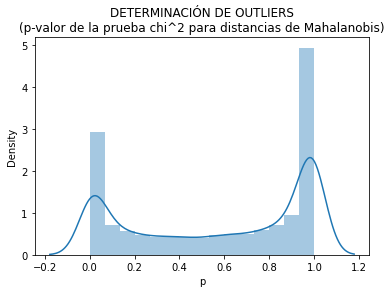

In [57]:
sns.distplot(df['p']).set_title("DETERMINACIÓN DE OUTLIERS\n(p-valor de la prueba chi^2 para distancias de Mahalanobis)")
 #hist

In [58]:
#valor menor a 0.001 lo considero outlier
prop= sum(df['p']<0.001) / df.shape[0] * 100
print('La proporción de outliers es del', round(prop,2), '%')

La proporción de outliers es del 7.41 %


In [59]:
df['categoria'] = np.where( df['p'] <  0.001, 'outlier', 'no')

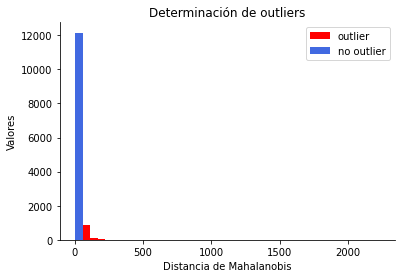

In [60]:
# divido las observaciones de acuerdo a si es outlier o no 
x1 = df[df['categoria']=='outlier']['mahalanobis'] # min(x1) para ver desde qué distancia de maha es considerado outlier
x2 = df[df['categoria']=='no']['mahalanobis']
# y grafico
counts, bins = np.histogram(df['mahalanobis'], bins=40)
f, ax = plt.subplots()
ax.hist(x1, bins=bins, color='red', label='outlier')
ax.hist(x2, bins=bins, color='royalblue',label='no outlier')
ax.set(xlabel="Distancia de Mahalanobis", ylabel="Valores", title="Determinación de outliers")
ax.legend(prop={'size': 10})
sns.despine()


# TAREA 2 
## Calculo de microestados utilizando k-means modificados

Aplicar el algoritmo de K-means modificado sobre los PGF P . Utilizar k = 2 − 10. Repetir el procedimiento más de una vez para cada valor de k

Decidir el mejor valor de k y calcular el promedio de Silhoutte, el parámetro de Validación Cruzada y la Variancia global explicada para cada k. 
 
Relizar gráfico de las tres medidas para el k correspondiente.

Para el valor de k óptimo realizar el perfil de Silhoutte completo. 

Inspeccionar, a partir de esta última figura, la presencia de outliers, si es necesario descartarlos del análisis y volver a calcular los clusters para este valor de k.



### función k means modif

In [61]:
# k means modificado
def kmeans3(gfp_maps,gfp_eval, n_maps, n_runs=10, maxerr=1e-6, maxiter=500):
  # los inputs son los mapas, el valor del gfp en los picos,
  # la cantidad de clusters, la cantidad de corridas,
  # error máximo, número máximo de iteraciones
  V = gfp_maps.T
  n_gfp = V.shape[0]
  n_ch = V.shape[1]
  sumV2 = np.sum(V**2)

  # Guarda resultados de cada corrida
  cv_list =   []  # cross-validation criterion for each k-means run
  maps_list = []  # microstate maps for each k-means run
  L_list =    []  # microstate label sequence for each k-means run
  
  for run in range(n_runs):
    # initialize random cluster centroids 
    rndi = np.random.permutation(n_gfp)[:n_maps]
    maps = V[rndi, :]
    # normalize row-wise (across EEG channels)
    maps /= np.sqrt(np.sum(maps**2, axis=1, keepdims=True))
    # initialize
    n_iter = 0
    var0 = 1.0
    var1 = 0.0
    # convergence criterion: variance estimate (step 6)
    while ( (np.abs((var0-var1)/var0) > maxerr) & (n_iter < maxiter) ):
      # (step 3) microstate sequence (= current cluster assignment)
      C = np.dot(V, maps.T)
      C /= (n_ch*np.outer(gfp_eval, np.std(maps, axis=1)))
      L = np.argmax(C**2, axis=1)
      # (step 4)
      for k in range(n_maps):
        Vt = V[L==k, :]
        # (step 4a)
        Sk = np.dot(Vt.T, Vt)
        # (step 4b)
        evals, evecs = np.linalg.eig(Sk)
        v = evecs[:, np.argmax(np.abs(evals))]
        v = v.real
        maps[k, :] = v/np.sqrt(np.sum(v**2))
        # (step 5)
        var1 = var0
        var0 = sumV2 - np.sum(np.sum(maps[L, :]*V, axis=1)**2)
        var0 /= (n_gfp*(n_ch-1))
        n_iter += 1
        if (n_iter > maxiter):
          print((f"\tK-means run {run+1:d}/{n_runs:d} did NOT converge "
                   f"after {maxiter:d} iterations."))
      # CROSS-VALIDATION criterion for this run (step 8)
    cv = var0 * (n_ch-1)**2/(n_ch-n_maps-1.)**2
    cv_list = np.append(cv_list,cv)
    maps_list.append(maps)
    L_list.append(L)
     
  # select best run. Lo elige en función del validación cruzada
  k_opt = np.argmin(cv_list)
  maps = maps_list[k_opt]# microstate maps for opt k-means run
  L  = L_list[k_opt]# microstate label sequence for opt k-means run
  cv = cv_list[k_opt] 
  return maps, L, cv

### función silhouette modificado y gráfico

In [62]:
def silhoutte_modificado2(maps,data,labels,ch,n_clusters):
    if data.shape[0]!=ch:
       data=data.T
    elif maps.shape[0]!=ch:
       maps=maps.T
    
    corr_ctodos =np.abs(np.corrcoef(data.T))
    sil = []
    for n,i in enumerate(data.T):
        L = labels[n]
        dist = 1-corr_ctodos[n,:]
        dist_=np.delete(dist,n)
        lab_ = np.delete(labels,n)
        prom_dist=[]
        for k in range(n_clusters):
            prom_dist.append(np.mean(dist_[lab_==k]))
        a=prom_dist[L]
        b=np.min(np.delete(prom_dist,L))
        sil.append((b-a)/np.max([a,b]))
    return sil

In [63]:

#%% Grafico silhoutte
def grafica_sil(n_clusters,sil,labels):
    import matplotlib.cm as cm
    # Create a subplot with 1 row and 2 columns
    fig = plt.figure()
    ax1 = fig.add_subplot(1, 1, 1)
    
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.5, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(labels) + (n_clusters + 1) * 10])

    
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = np.mean(sil)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = np.array(sil)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
   # ax1.set_xticks([-1,-0.5,-0.2,0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.show()

### resultado cabecitas en picos (general) por PCA

In [64]:
#tiempos = [tt for tt,x0,x1,x2 in zip(t,GFP[0:-2],GFP[1:-1],GFP[2:]) if (x0<x1 and x1>x2)]
#indx = [ss for ss,x0,x1,x2 in zip(s,GFP[0:-2],GFP[1:-1],GFP[2:]) if (x0<x1 and x1>x2)] 
#GFP_picos= GFP[indx]
eeg_picos=EEGdata_final[:,indx] # --> esto es lo mismo que mapas, la diferencia 
#es que en "mapas" está c/dato como una lista. Cada lista tiene los datos EEG al tiempo de un dado GFP peak

print(len(GFP_picos))
# mapas
pca = decomposition.PCA(n_components=5)
pca.fit(eeg_picos)
pcs = pca.transform(eeg_picos)
print(pcs.shape)
var = pca.explained_variance_ratio_

13135
(30, 5)


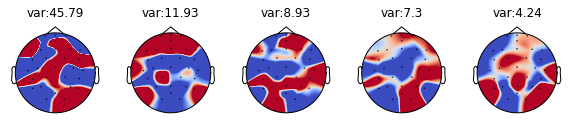

In [65]:
fig2, ax = plt.subplots(ncols=pcs.shape[1], figsize=(10, 3), gridspec_kw=dict(top=0.9),
                       sharex=True, sharey=True)
for p in range(pcs.shape[1]):
  mne.viz.plot_topomap(pcs[:,p],
                    info_eeg,
                    cmap='coolwarm', vmin=-100,vmax=100, contours=0,
                    axes=ax[p],show=False)
  ax[p].set_title('var:'+str(round(var[p]*100,2)) )

### Empieza la parte de distintos k y métricas.


In [70]:
SIL=[]
CV=[]

for i in range(2,11):
  n_clusters =i
  maps_kmeans,labels_gfp,cv = kmeans3(eeg_picos, GFP_picos, n_clusters , n_runs=100, maxerr=1e-6, maxiter=1000) # subí a 1000 porque 500 no alcanzaba
# kmeans recibe mapas, valor GFP en picos, numero de clusters, resto se determina a mano

  sil = silhoutte_modificado2(maps_kmeans, eeg_picos,labels_gfp, ch,n_clusters)
  SIL.append(sum(sil)/len(sil))
  
  CV.append(cv)
  

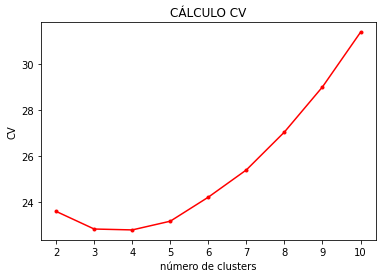

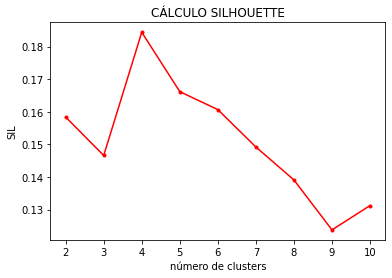

In [71]:
range_k = [i for i in range(2,11)]

plt.plot(range_k,CV,'r.-')
plt.ylabel('CV')
plt.xlabel('número de clusters')
plt.title('CÁLCULO CV')
plt.show()

plt.plot(range_k,SIL,'r.-')
plt.ylabel('SIL')
plt.xlabel('número de clusters')
plt.title('CÁLCULO SILHOUETTE')
plt.show()


## prototipo por clusterización de kmeans modificado

### **Eligiendo clusters=4**

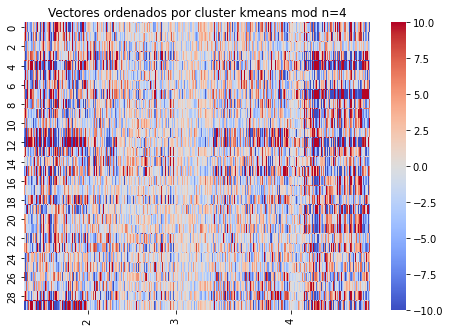

For n_clusters = 4 The average silhouette_score is : 0.1844206271504115


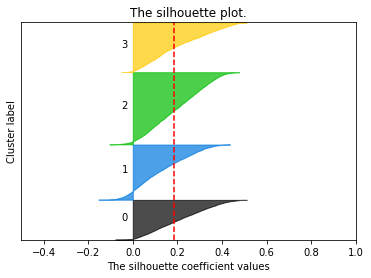

In [72]:
n_clusters =4
maps_kmeans,labels_gfp,cv = kmeans3(eeg_picos, GFP_picos, n_clusters , n_runs=100, maxerr=1e-6, maxiter=1000) # subí a 1000 porque 500 no alcanzaba

marcasx=np.array(np.where(np.diff(np.sort(labels_gfp))==1))

plt.figure()
plt.axes([0, 0, 1, 1])
sns.heatmap(eeg_picos[:,np.argsort(labels_gfp)],vmin=-10,vmax=10, cmap='coolwarm')
plt.title('Vectores ordenados por cluster kmeans mod n=' + str(n_clusters))
plt.xticks(marcasx[0,:],labels=list(map(str, np.arange(2,n_clusters+1))))
plt.show()
sil = silhoutte_modificado2(maps_kmeans, eeg_picos,labels_gfp, ch,n_clusters)
grafica_sil(n_clusters,sil,labels_gfp)

data_cluster0


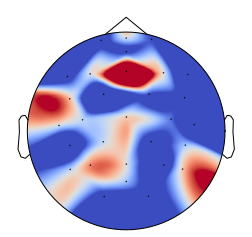

data_cluster1


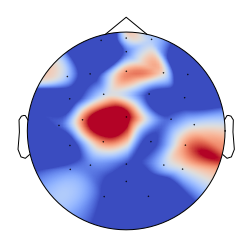

data_cluster2


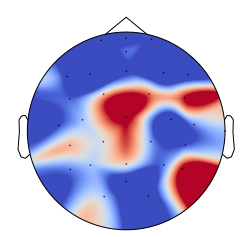

data_cluster3


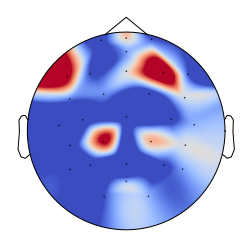

In [73]:
def namestr(obj,namespace):
    return [name for name in namespace if namespace[name] is obj]

    # Ahora voy a juntar la eegdata según el cluster

data_cluster0= eeg_picos[:,labels_gfp==0]
data_cluster1= eeg_picos[:,labels_gfp==1]
data_cluster2= eeg_picos[:,labels_gfp==2]
data_cluster3= eeg_picos[:,labels_gfp==3]


lista_data=[data_cluster0, data_cluster1,data_cluster2,data_cluster3]

for dataset in lista_data:
  print(namestr(dataset,globals())[0])
  topologia(dataset, info_eeg)

In [74]:
# análisis de porcentaje que queda negativo
resumen=pd.DataFrame({'SIL': sil, 'LABELS': labels_gfp})

negativos = resumen[resumen['SIL'] < 0].groupby('LABELS')['SIL'].count()
totales = resumen.groupby('LABELS')['SIL'].count()

porcentaje_neg = round(negativos/totales*100,2)

porcentaje_neg

LABELS
0     1.95
1    16.23
2     4.25
3     2.17
Name: SIL, dtype: float64

In [75]:
# ahora analizar lo mismo pero con k=4 pero sin los outliers determinados por mahalanobis
#df.head() # acá la df estaba traspuesta. Yo lo que voy a tener acá son el valor de la columna q quiero sacarme de encima en la matriz de datos

outlier_indices = (df.index[df["categoria"] == "outlier"]).values
outlier_indices.shape #973 outliers

(973,)

For n_clusters = 4 The average silhouette_score is : 0.18565076210485418


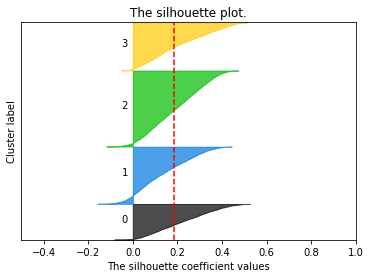

In [76]:
eeg_picos_sin_outliers=np.delete(eeg_picos, outlier_indices , axis=1) #columna
labels_gfp_sin_outliers=np.delete(labels_gfp, outlier_indices )
sil2 = silhoutte_modificado2(maps_kmeans, eeg_picos_sin_outliers,labels_gfp_sin_outliers, ch,n_clusters)
grafica_sil(n_clusters,sil2,labels_gfp_sin_outliers)

In [77]:
resumen1=pd.DataFrame({'SIL': sil2, 'LABELS': labels_gfp_sin_outliers})

negativos = resumen1[resumen1['SIL'] < 0].groupby('LABELS')['SIL'].count()
totales = resumen1.groupby('LABELS')['SIL'].count()

porcentaje_neg = round(negativos/totales*100,2)

porcentaje_neg

LABELS
0     1.70
1    14.51
2     4.85
3     2.98
Name: SIL, dtype: float64

# TAREA 3 
## Validación externa

Realizar dos métodos de clustering diferentes para los ~xn. Determinar la distancia que va a utilizar. Justificar brevemente porque se eligen esos métodos y nociones de distancia. Realice una inspección de las características de los clusters hallados y de los prototipos de cada cluster en caso que los hubiese (o de ejemplos en el caso que no), comparar con los encontrados por el método de k-means modificado.
Calcular la matriz de confusión entre algoritmos. Determinar el índice Rand. (0.5 rand es al azar)


### calculo matriz de distancia coseno (correlación)

In [78]:
#d_corr = np.corrcoef((EEGdata_final[:,indx]).T) 
d_coseno=cosine_distances((EEGdata_final[:,indx]).T)
#d_gower= gower.gower_matrix(pd.DataFrame(mapas))


### CLUSTERING JERARQUICO

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  """Entry point for launching an IPython kernel.


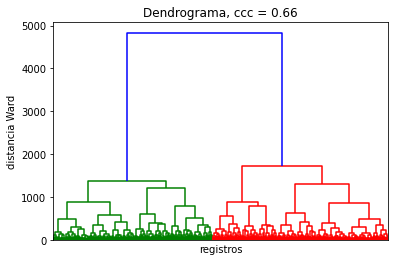

In [79]:
Z1 = linkage(d_coseno, 'ward') 
c,_=cophenet(Z1,Y=squareform(d_coseno))
plt.title('Dendrograma, ccc = %0.2f'%c)
plt.xlabel('registros')
plt.ylabel('distancia Ward')
dn1 = dendrogram(Z1,no_labels=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  """Entry point for launching an IPython kernel.


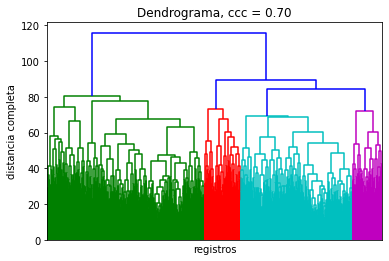

In [80]:
Z = linkage(d_coseno, 'complete') 
c,_=cophenet(Z,Y=squareform(d_coseno))
plt.title('Dendrograma, ccc = %0.2f'%c)
plt.xlabel('registros')
plt.ylabel('distancia completa')
dn2 = dendrogram(Z,no_labels=True)

In [81]:
DendogramLabels= fcluster(Z,81, criterion='distance')
print(np.unique(DendogramLabels))
DendogramLabels.shape

[1 2 3 4]


(13135,)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  """Entry point for launching an IPython kernel.


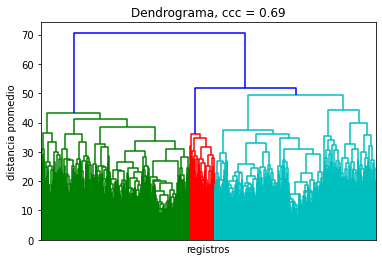

In [82]:
Z2 = linkage(d_coseno, 'average')
c,_=cophenet(Z2,Y=squareform(d_coseno))
plt.title('Dendrograma, ccc = %0.2f'%c)
plt.xlabel('registros')
plt.ylabel('distancia promedio')
dn3 = dendrogram(Z2,no_labels=True)

### Kmedoids

0.19651323358011002
3191.2501749823573


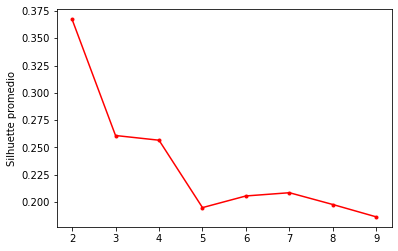

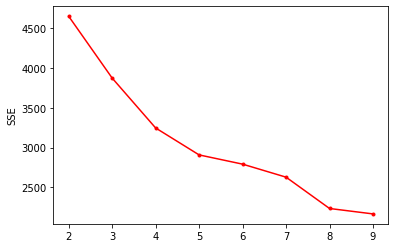

In [83]:
def calcula_sse_kmedoids(KM,d):
  se = []
  for i in range(0,KM.n_clusters):
    se.append(sum(d[KM.medoid_indices_[i],KM.labels_==i]**2))
  return sum(se)

KM_medoi=KMedoids(n_clusters=4,metric='precomputed',init='k-medoids++').fit(d_coseno) # pide valores positivos!!!

print(silhouette_score(d_coseno,KM_medoi.labels_,metric='precomputed'))
print(calcula_sse_kmedoids(KM_medoi,d_coseno))
silhouette_samples(d_coseno,KM_medoi.labels_,metric='precomputed')

range_k = [i for i in range(2,10)]
silh = []
sse = []

for k in range_k:
    KM_medoi = KMedoids(n_clusters=k,metric='precomputed',init='heuristic').fit(d_coseno)

    silh.append(silhouette_score(d_coseno,KM_medoi.labels_,metric='precomputed'))
    sse.append(calcula_sse_kmedoids(KM_medoi,d_coseno))

plt.plot(range_k,silh,'r.-')
plt.ylabel('Silhuette promedio')
plt.show()

plt.plot(range_k,sse,'r.-')
plt.ylabel('SSE')
plt.show()


In [84]:
KM_medoi = KMedoids(n_clusters=4,metric='precomputed',init='heuristic').fit(d_coseno)
KMdeoidLabels=KM_medoi.labels_

### DBSCAN

In [85]:
# https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html
distancias_DBSCAN1=[]

for i in range(0,len(d_coseno)):
  valor=(np.sort(d_coseno[i]))[3]
  distancias_DBSCAN1.append(valor)

distancias_DBSCAN1=np.sort(distancias_DBSCAN1)

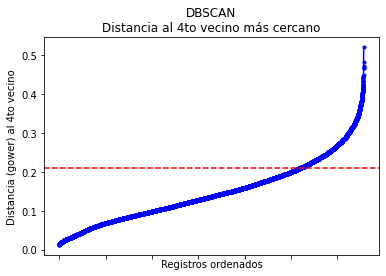

In [86]:
# Grafico con d_coseno
fig, ax = plt.subplots()
plt.plot(distancias_DBSCAN1,'b.-')
plt.ylabel('Distancia (gower) al 4to vecino')
plt.xlabel('Registros ordenados')
plt.title('DBSCAN\nDistancia al 4to vecino más cercano')
ax.tick_params(labelbottom=False)  
plt.axhline(y=0.21, color='r', linestyle='--')

plt.show()

In [87]:
rtado_dbscan0=DBSCAN(eps=0.21, min_samples=5, metric='precomputed').fit(d_coseno)

In [88]:
print(np.unique(rtado_dbscan0.labels_))
print(len(rtado_dbscan0.labels_))

[-1  0]
13135


In [89]:
DBSCANLabels=rtado_dbscan0.labels_
KMeansLabels=labels_gfp

### Cálculo de índice de Rand

In [90]:
print(KMdeoidLabels.shape)
print(KMeansLabels.shape)
print(DendogramLabels.shape)

RAND_meoide=round(adjusted_rand_score(KMeansLabels,KMdeoidLabels),3)
RAND_dendograma=round(adjusted_rand_score(KMeansLabels,DendogramLabels),3)  
#RAND_DBSCAN=round(adjusted_rand_score(KMeansLabels,DBSCANLabels),3)  
print('Rand meoide:',RAND_meoide,' \nRand dendograma:',RAND_dendograma)

print(KMdeoidLabels)
print(KMeansLabels)
print(DendogramLabels)

print(np.unique(KMdeoidLabels))
print(np.unique(KMeansLabels))
print(np.unique(DendogramLabels))

(13135,)
(13135,)
(13135,)
Rand meoide: 0.106  
Rand dendograma: 0.027
[1 3 1 ... 3 0 0]
[1 2 1 ... 2 3 2]
[1 1 1 ... 1 4 3]
[0 1 2 3]
[0 1 2 3]
[1 2 3 4]


### prototipos de cada uno de los métodos

In [91]:
def namestr(obj,namespace):
    return [name for name in namespace if namespace[name] is obj]

data_cluster0_meoides= eeg_picos[:,KMdeoidLabels==0]
data_cluster1_meoides= eeg_picos[:,KMdeoidLabels==1]
data_cluster2_meoides= eeg_picos[:,KMdeoidLabels==2]
data_cluster3_meoides= eeg_picos[:,KMdeoidLabels==3]

data_cluster0_means= eeg_picos[:,KMeansLabels==0]
data_cluster1_means= eeg_picos[:,KMeansLabels==1]
data_cluster2_means= eeg_picos[:,KMeansLabels==2]
data_cluster3_means= eeg_picos[:,KMeansLabels==3]

data_cluster0_dend= eeg_picos[:,DendogramLabels==1]
data_cluster1_dend= eeg_picos[:,DendogramLabels==2]
data_cluster2_dend= eeg_picos[:,DendogramLabels==3]
data_cluster3_dend= eeg_picos[:,DendogramLabels==4]

data_cluster0_DBSCAN= eeg_picos[:,DBSCANLabels==-1]
data_cluster1_DBSCAN= eeg_picos[:,DBSCANLabels==0]


lista_data_meoides=[data_cluster0_meoides, data_cluster1_meoides,data_cluster2_meoides,data_cluster3_meoides]
lista_data_means=[data_cluster0_means, data_cluster1_means,data_cluster2_means,data_cluster3_means]
lista_data_dend=[data_cluster0_dend, data_cluster1_dend,data_cluster2_dend,data_cluster3_dend]
lista_data_DBSCAN=[data_cluster0_DBSCAN, data_cluster1_DBSCAN]


In [92]:
print(data_cluster0_DBSCAN.shape[1])
print(data_cluster1_DBSCAN.shape[1])

1849
11286


data_cluster0_DBSCAN


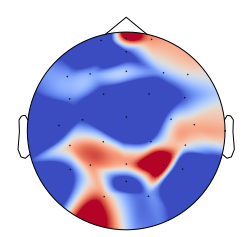

data_cluster1_DBSCAN


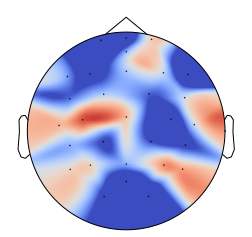

In [93]:
for dataset in lista_data_DBSCAN:
  print(namestr(dataset,globals())[1])
  topologia(dataset, info_eeg)

data_cluster0_meoides


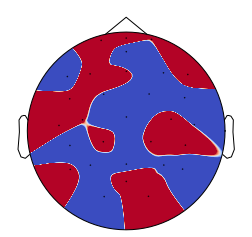

data_cluster1_meoides


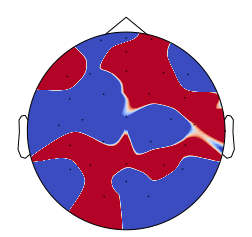

data_cluster2_meoides


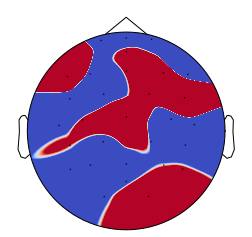

data_cluster3_meoides


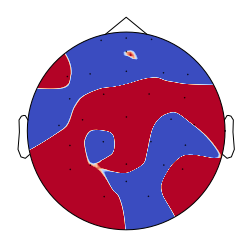

In [94]:
for dataset in lista_data_meoides:
  print(namestr(dataset,globals())[1])
  topologia(dataset, info_eeg)

data_cluster0_means


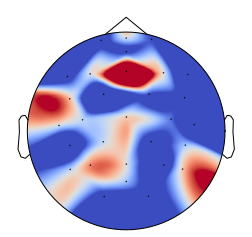

data_cluster1_means


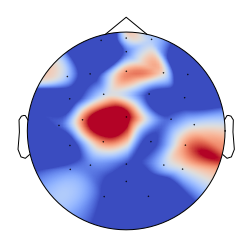

data_cluster2_means


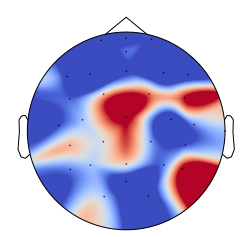

data_cluster3_means


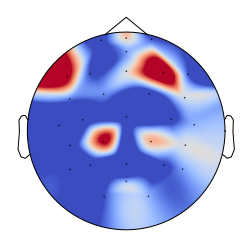

In [95]:
for dataset in lista_data_means:
  print(namestr(dataset,globals())[1])
  topologia(dataset, info_eeg)

data_cluster0_dend


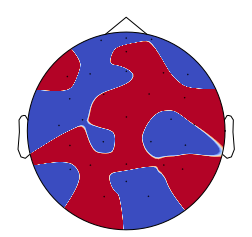

data_cluster1_dend


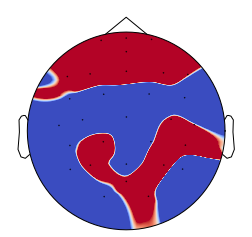

data_cluster2_dend


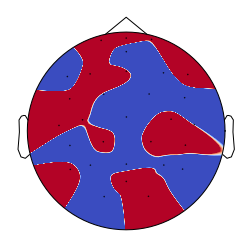

data_cluster3_dend


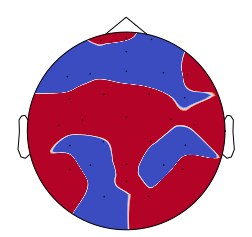

In [96]:
for dataset in lista_data_dend:
  print(namestr(dataset,globals())[1])
  topologia(dataset, info_eeg)

# TAREA 4 
## Visualización

visualizar los datos y las etiquetas de cluster asignadas en baja dimensión con alguna técnica de reducción (PCA, TSNE, MDS, etc). Esto se puede repetir para alguna variación que encuentren interesante, como para distintos valores de k o
distintas nociones de distancia.

In [97]:
from sklearn.manifold import MDS, Isomap, SpectralEmbedding, TSNE

In [98]:
tsne_data=scale(eeg_picos.T) #np array
tsne10 = TSNE(n_components=2,perplexity=10) 
datos_tsne10 = tsne10.fit_transform(tsne_data)

In [99]:
tsne25 = TSNE(n_components=2,perplexity=25) 
datos_tsne25 = tsne25.fit_transform(tsne_data)

In [100]:
tsne50 = TSNE(n_components=2,perplexity=50) 
datos_tsne50 = tsne50.fit_transform(tsne_data)

In [101]:
tsne100 = TSNE(n_components=2,perplexity=100) 
datos_tsne100 = tsne100.fit_transform(tsne_data)

In [102]:
tsne150 = TSNE(n_components=2,perplexity=150) 
datos_tsne150 = tsne150.fit_transform(tsne_data)

In [103]:
tsne250 = TSNE(n_components=2,perplexity=250) 
datos_tsne250 = tsne250.fit_transform(tsne_data)

In [104]:
tsne500 = TSNE(n_components=2,perplexity=500) 
datos_tsne500 = tsne500.fit_transform(tsne_data)

Text(0, 0.5, 'Variable TSNE 2')

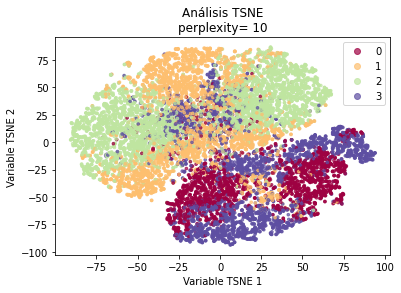

In [105]:
scatter=plt.scatter(datos_tsne10[:,0],datos_tsne10[:,1],c=labels_gfp,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2','3'])
plt.title("Análisis TSNE\nperplexity= 10")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

Text(0, 0.5, 'Variable TSNE 2')

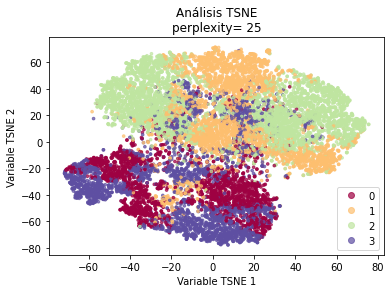

In [106]:
scatter=plt.scatter(datos_tsne25[:,0],datos_tsne25[:,1],c=labels_gfp,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2','3'])
plt.title("Análisis TSNE\nperplexity= 25")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

Text(0, 0.5, 'Variable TSNE 2')

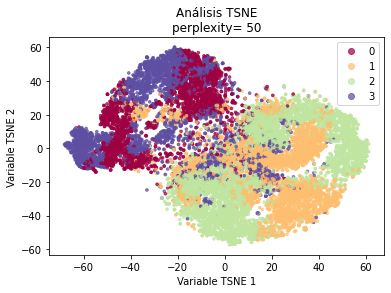

In [107]:
scatter=plt.scatter(datos_tsne50[:,0],datos_tsne50[:,1],c=labels_gfp,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2','3'])
plt.title("Análisis TSNE\nperplexity= 50")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

Text(0, 0.5, 'Variable TSNE 2')

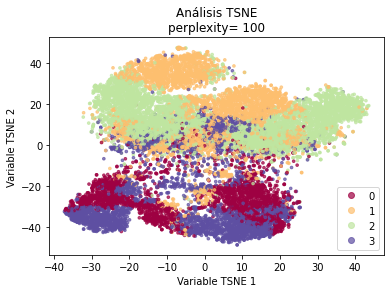

In [108]:
scatter=plt.scatter(datos_tsne100[:,0],datos_tsne100[:,1],c=labels_gfp,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2','3'])
plt.title("Análisis TSNE\nperplexity= 100")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

Text(0, 0.5, 'Variable TSNE 2')

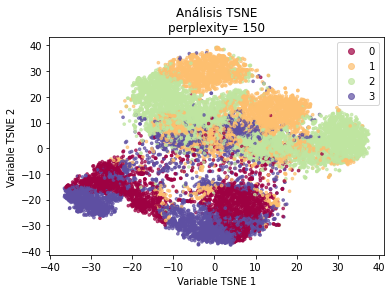

In [109]:
scatter=plt.scatter(datos_tsne150[:,0],datos_tsne150[:,1],c=labels_gfp,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2','3'])
plt.title("Análisis TSNE\nperplexity= 150")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

Text(0, 0.5, 'Variable TSNE 2')

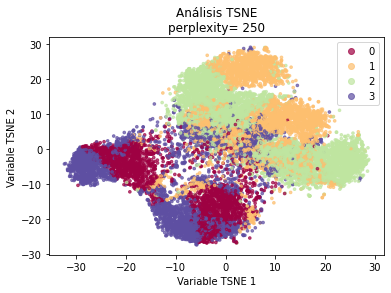

In [110]:
scatter=plt.scatter(datos_tsne250[:,0],datos_tsne250[:,1],c=labels_gfp,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2','3'])
plt.title("Análisis TSNE\nperplexity= 250")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

Text(0, 0.5, 'Variable TSNE 2')

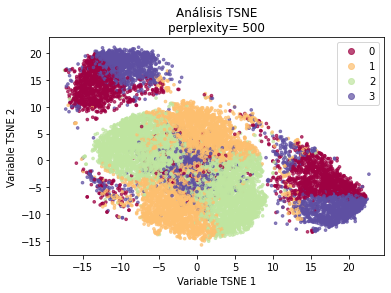

In [111]:
scatter=plt.scatter(datos_tsne500[:,0],datos_tsne500[:,1],c=labels_gfp,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2','3'])
plt.title("Análisis TSNE\nperplexity= 500")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

Text(0, 0.5, 'Variable TSNE 2')

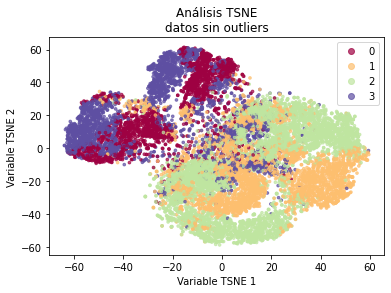

In [112]:
tsne_data_sinoutliers=scale(eeg_picos_sin_outliers.T) #np array
tsne_so = TSNE(n_components=2,perplexity=50) 
datos_tsne_so = tsne_so.fit_transform(tsne_data_sinoutliers)
scatter=plt.scatter(datos_tsne_so[:,0],datos_tsne_so[:,1],c=labels_gfp_sin_outliers,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2','3'])
plt.title("Análisis TSNE\ndatos sin outliers")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

### Prueba con perplexity 50, k=2 o k=6

For n_clusters = 6 The average silhouette_score is : 0.1604353346674242


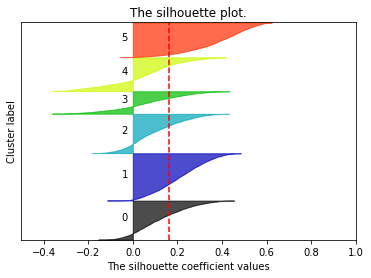

Text(0, 0.5, 'Variable TSNE 2')

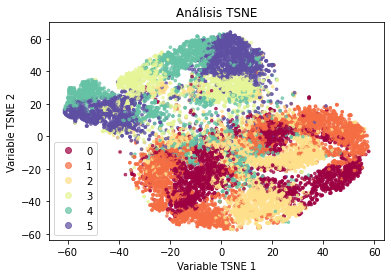

In [113]:
n_clusters =6
maps_kmeans,labels_gfp,cv = kmeans3(eeg_picos, GFP_picos, n_clusters , n_runs=100, maxerr=1e-6, maxiter=1000) # subí a 1000 porque 500 no alcanzaba
marcasx=np.array(np.where(np.diff(np.sort(labels_gfp))==1))
sil = silhoutte_modificado2(maps_kmeans, eeg_picos,labels_gfp, ch,n_clusters)
grafica_sil(n_clusters,sil,labels_gfp)
tsne_data=scale(eeg_picos.T) #np array
tsne = TSNE(n_components=2,perplexity=50) 
datos_tsne = tsne.fit_transform(tsne_data)
scatter=plt.scatter(datos_tsne[:,0],datos_tsne[:,1],c=labels_gfp,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2','3','4','5'])
plt.title("Análisis TSNE")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

For n_clusters = 2 The average silhouette_score is : 0.1583786581543337


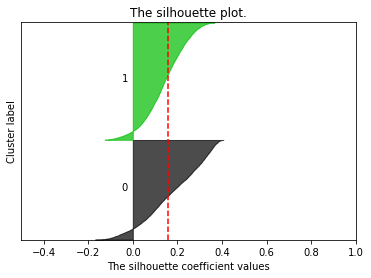

Text(0, 0.5, 'Variable TSNE 2')

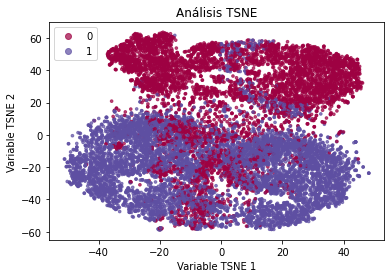

In [114]:
n_clusters =2
maps_kmeans,labels_gfp,cv = kmeans3(eeg_picos, GFP_picos, n_clusters , n_runs=100, maxerr=1e-6, maxiter=1000) # subí a 1000 porque 500 no alcanzaba
marcasx=np.array(np.where(np.diff(np.sort(labels_gfp))==1))
sil = silhoutte_modificado2(maps_kmeans, eeg_picos,labels_gfp, ch,n_clusters)
grafica_sil(n_clusters,sil,labels_gfp)
tsne_data=scale(eeg_picos.T) #np array
tsne = TSNE(n_components=2,perplexity=50) 
datos_tsne = tsne.fit_transform(tsne_data)
scatter=plt.scatter(datos_tsne[:,0],datos_tsne[:,1],c=labels_gfp,cmap=plt.cm.Spectral,alpha=0.7, s=7)
plt.legend(handles=scatter.legend_elements()[0], labels=['0','1','2'])
plt.title("Análisis TSNE")
plt.xlabel("Variable TSNE 1")
plt.ylabel("Variable TSNE 2")

# TAREA 5 
## Comparación de medidas de los microestados

Calcule el ajuste de los datos de EEG a los prototipos de microestados hallados en la Tarea 2 para cada registro. Realice un suavizado de las series temporales (puede utilizar una ventana promedio móvil) y asigne a cada punto temporal el mapa prototipo que presente
mayor correlación.
A partir de aca debe elegir al menos uno de los siguientes medidas para comparar entre ambas condiciones experimentales (antes y después del aprendizaje): (ver medidas en d’Croz -Baron y colaboradores [3])

- Duración promedio de cada microestado.
- Frecuencia de ocurrencia.
- Fracción de tiempo cubierto.
- Global Explanined Variance.

**Frecuencias de los picos en la condición pre y post aprendizaje**

In [115]:
# Frecuencias totales en picos
(unique, counts) = np.unique(KMeansLabels, return_counts=True)
frequencies = np.asarray((unique, counts))
print(frequencies)

[[   0    1    2    3]
 [2412 3346 4375 3002]]


In [116]:
# Frecuencia en picos, en la condición pre y post
nombres_files=[]

for filename in os.listdir(folder):
  f=str(os.path.join(filename))[:-4] 
  nombres_files.append(f)

print(nombres_files)

['suj_9_bl_1', 'suj_9_bl_2', 'suj_10_bl_1', 'suj_10_bl_2', 'suj_8_bl_1', 'suj_8_bl_2', 'suj_12_bl_1', 'suj_12_bl_2', 'suj_13_bl_1', 'suj_13_bl_2']


In [117]:
resultados_kmeans=np.array_split(KMeansLabels,10)
resultados_kmeans

[array([1, 2, 1, ..., 1, 2, 2]),
 array([1, 1, 2, ..., 2, 3, 2]),
 array([2, 1, 1, ..., 1, 1, 1]),
 array([1, 1, 1, ..., 2, 2, 2]),
 array([2, 2, 2, ..., 3, 3, 3]),
 array([0, 0, 3, ..., 1, 0, 0]),
 array([0, 1, 3, ..., 0, 0, 3]),
 array([3, 0, 3, ..., 2, 1, 1]),
 array([2, 1, 1, ..., 1, 1, 1]),
 array([3, 1, 1, ..., 2, 3, 2])]

In [118]:
resultados_pre=[]
resultados_post=[]
for i in range(0, len(resultados_kmeans), 2):
  resultados_pre.append(resultados_kmeans[i])
  resultados_post.append(resultados_kmeans[i+1])

resultados_pre= np.concatenate(resultados_pre)
resultados_post= np.concatenate(resultados_post)

In [119]:
frec_pre=np.unique(resultados_pre, return_counts=True)
fp=frec_pre[1]/resultados_pre.shape[0]
print(fp)

[0.17783191 0.2545676  0.33297808 0.23462241]


In [120]:
frec_post=np.unique(resultados_post, return_counts=True)
fpp=frec_post[1]/resultados_post.shape[0]
print(fpp)

[0.18943201 0.25491092 0.33318106 0.22247602]
